In [1]:
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt
import matplotlib.cm as cm
plt.style.use('seaborn-whitegrid')

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

from keras.datasets import mnist
(train_x, train_y), (test_x, test_y) = mnist.load_data()

print (train_x.shape)
print (test_x.shape)
print (train_y.shape)
print (test_y.shape)

(60000, 28, 28)
(10000, 28, 28)
(60000,)
(10000,)


In [2]:
train_x = train_x.reshape((len(train_x), np.prod(train_x.shape[1:])))
test_x = test_x.reshape((len(test_x), np.prod(test_x.shape[1:])))

print (train_x.shape)
print (test_x.shape)

(60000, 784)
(10000, 784)


In [3]:
scaler = MinMaxScaler()
train_x = scaler.fit_transform(train_x) # train_x.astype('float32') / 255.
test_x = scaler.fit_transform(test_x) # test_x = test_x.astype('float32') / 255.

print (train_x.shape)
print (test_x.shape)

(60000, 784)
(10000, 784)


In [4]:
df_all = {}
for i in range(len(train_x)):
    if train_y[i] == 3 or train_y[i] == 9:
        df_all[i] = [train_y[i]] + train_x[i].tolist()
        
for i in range(len(test_x)):
    if test_y[i] == 3 or test_y[i] == 9:
        df_all[i] = [test_y[i]] + test_x[i].tolist()

column_names = ['label'] + ['pixel' + str(i) for i in range(784)]
df_all = pd.DataFrame(df_all).T
df_all.columns = column_names
df_all.reset_index(drop=True, inplace=True)

df_all

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13695,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13696,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13697,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13698,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
data = df_all.drop(columns='label')
data

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13695,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13696,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13697,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13698,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
def SSE(points):
    points = np.array(points)
    if len(points.shape) == 1:
        points = np.expand_dims(points, -1)
        
    means = np.mean(points, 0) # initialize all means
    squared_errors = np.linalg.norm(points - means, ord=2, axis=1)
    
    return np.sum(squared_errors)

In [7]:
def kMeans(points, k=2, max_iter=100):
    # points are data points of observations
    # each vector will be assigned to one cluster exclusively
    # k stands for the number of clusters (<< N)
    points = np.array(points)
    if len(points.shape) == 1:
        points = np.expand_dims(points, -1) # 2D array

    np.random.seed(1207)
    np.random.shuffle(points)
    centroids = points[0:k, :]
    
    best_sse, prev_sse = np.inf, np.inf
    for it in range(max_iter):
        # assignment step
        clusters = [None] * k
        for p in points:
            index = np.argmin(np.linalg.norm(p-centroids, 2, 1))
            if clusters[index] is None:
                clusters[index] = np.expand_dims(p, 0)
            else:
                clusters[index] = np.vstack((clusters[index], p))

        # update step
        centroids = [np.mean(c, 0) for c in clusters]
        sse = np.sum([SSE(c) for c in clusters])

        tolerance = prev_sse - sse
        print('Iter: {:4d}, SSE: {:12.4f}, Tolerance: {:12.4f}'.format(it, sse, tolerance))

        if sse < best_sse:
            best_clusters, best_sse = clusters, sse

        # repeat until it converges
        if np.isclose(tolerance, 0, atol=0.00001):
            break

        prev_sse = sse

    return best_clusters

In [9]:
def visualize_image(clusters, dim, k, cluster_id):
    rows = 10 # defining no. of rows in figure
    cols = 10 # defining no. of colums in figure

    fig = plt.figure(figsize=(2*cols, 2*rows)) # defining a figure
    for i in range(rows*cols):
        fig.add_subplot(rows, cols, i+1) # adding sub plot to figure on each iteration
        if dim == 'raw':
            fig.suptitle('k {} Cluster {} size {}'.format(
                k, cluster_id, len(clusters[cluster_id])), fontsize=30, y=0.92)
            plt.imshow(clusters[cluster_id][i].reshape((28, 28))*255., cmap='gray') # image

        else:
            fig.suptitle('Dim {} Cluster {} size {}'.format(
                dim, cluster_id, len(clusters[cluster_id])), fontsize=30, y=0.92)
            recovered_cluster = pca.inverse_transform(clusters[cluster_id][i])
            plt.imshow(recovered_cluster.reshape((28, 28))*255., cmap='gray') # image
            
        plt.title(str([cluster_id]), y=-0.15, color='green') # answer
        plt.axis('off')
        
    plt.savefig('kMeans_{}_{}_{}.jpg'.format(dim, k, cluster_id))

2
Iter:    0, SSE:   90617.7912, Tolerance:          inf
Iter:    1, SSE:   88415.9259, Tolerance:    2201.8653
Iter:    2, SSE:   87428.2853, Tolerance:     987.6407
Iter:    3, SSE:   87065.7151, Tolerance:     362.5701
Iter:    4, SSE:   86984.2474, Tolerance:      81.4678
Iter:    5, SSE:   86969.9368, Tolerance:      14.3106
Iter:    6, SSE:   86967.0274, Tolerance:       2.9094
Iter:    7, SSE:   86966.6506, Tolerance:       0.3768
Iter:    8, SSE:   86966.5726, Tolerance:       0.0780
Iter:    9, SSE:   86966.5839, Tolerance:      -0.0113
Iter:   10, SSE:   86966.5743, Tolerance:       0.0097
Iter:   11, SSE:   86966.6065, Tolerance:      -0.0323
Iter:   12, SSE:   86966.5137, Tolerance:       0.0929
Iter:   13, SSE:   86966.5052, Tolerance:       0.0085
Iter:   14, SSE:   86966.5866, Tolerance:      -0.0814
Iter:   15, SSE:   86966.5927, Tolerance:      -0.0061
Iter:   16, SSE:   86966.5889, Tolerance:       0.0038
Iter:   17, SSE:   86966.5889, Tolerance:       0.0000
3
Iter: 

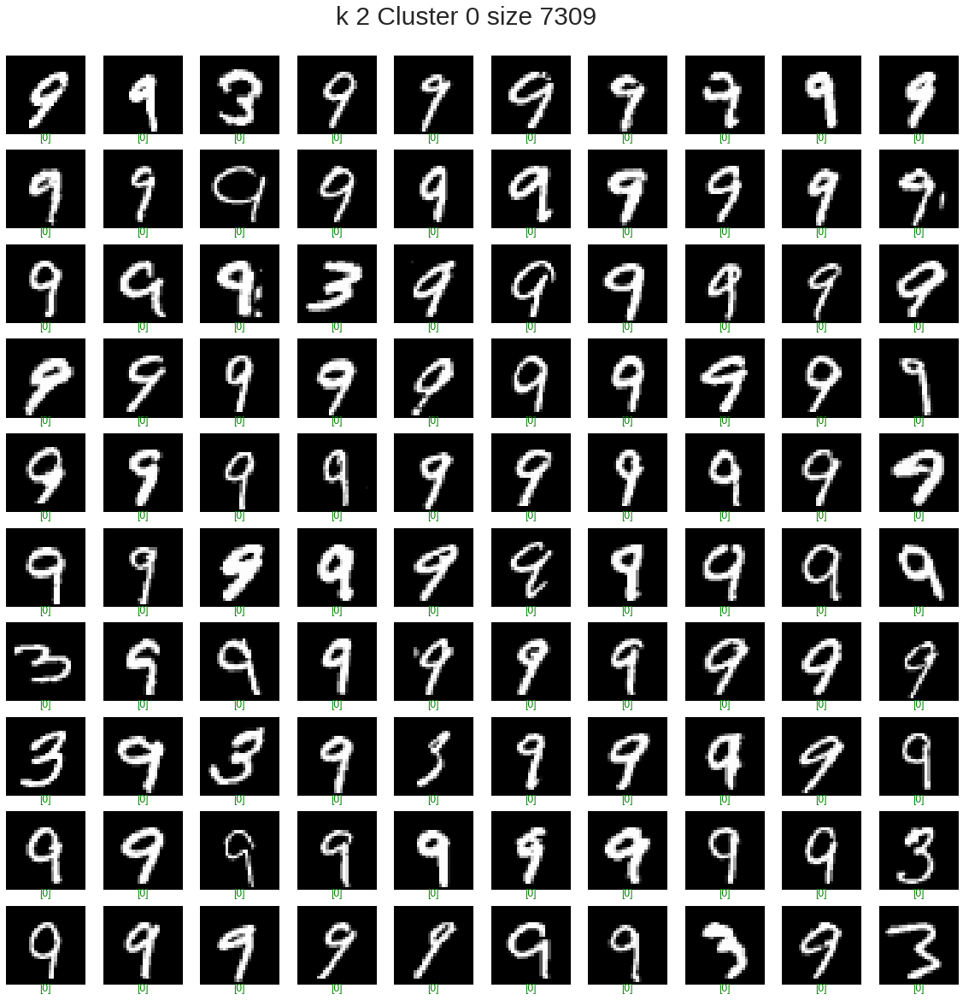

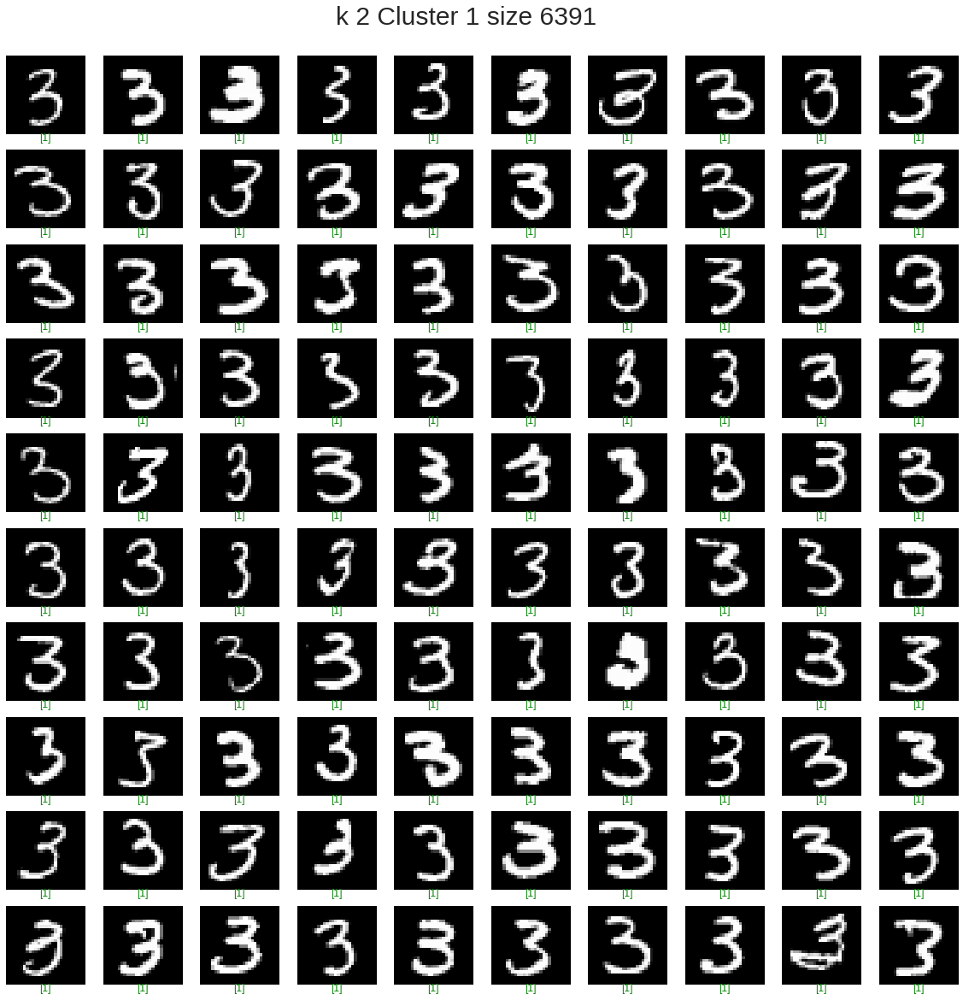

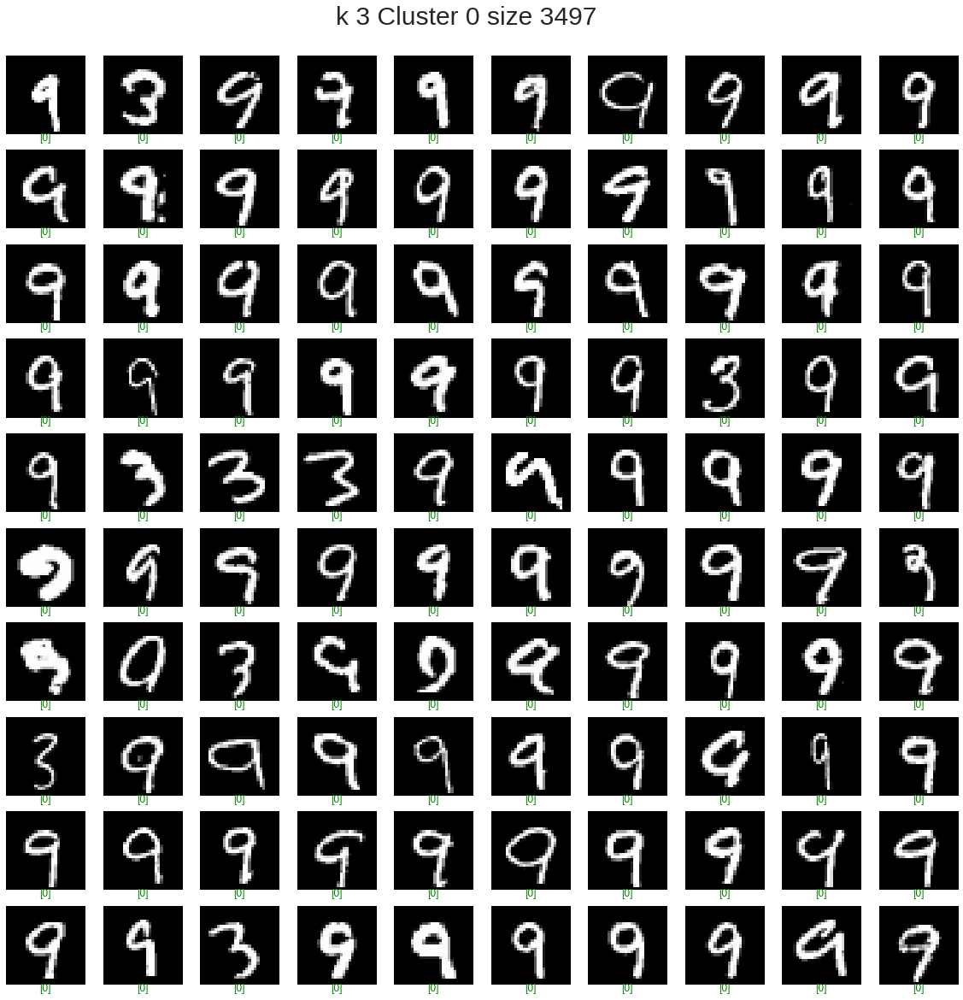

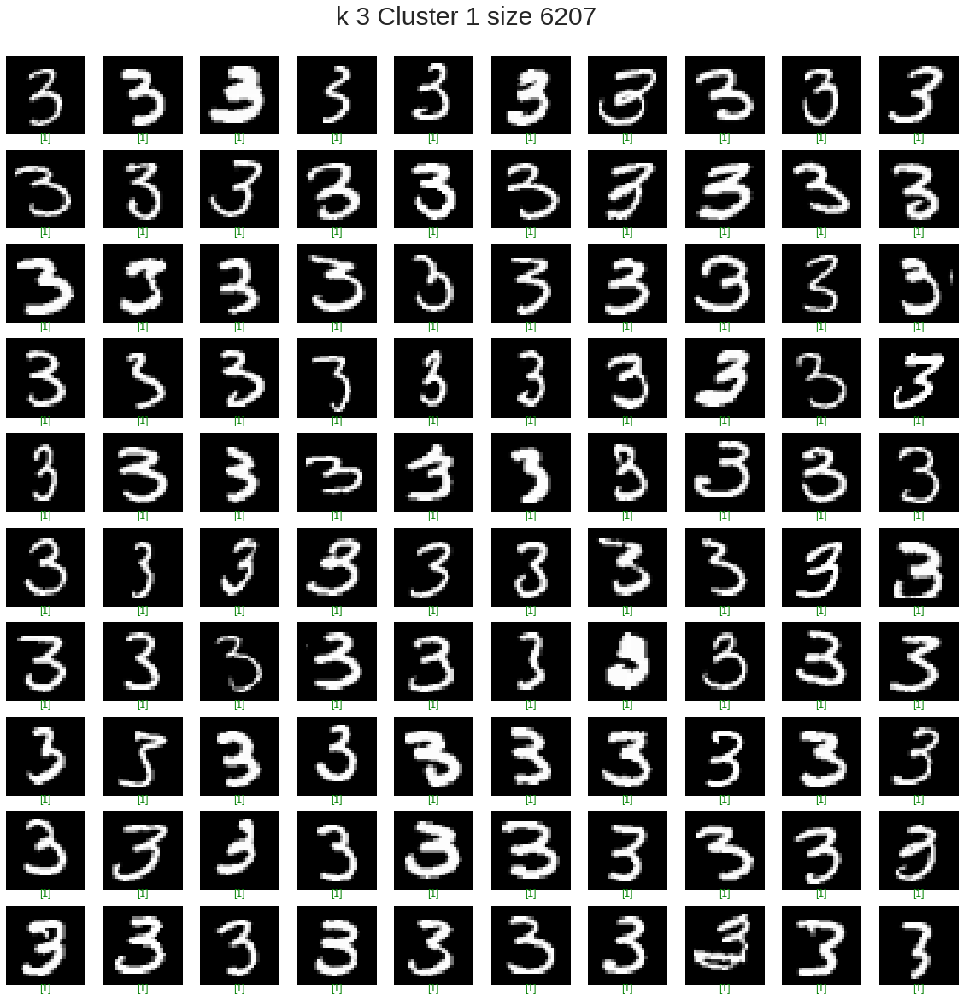

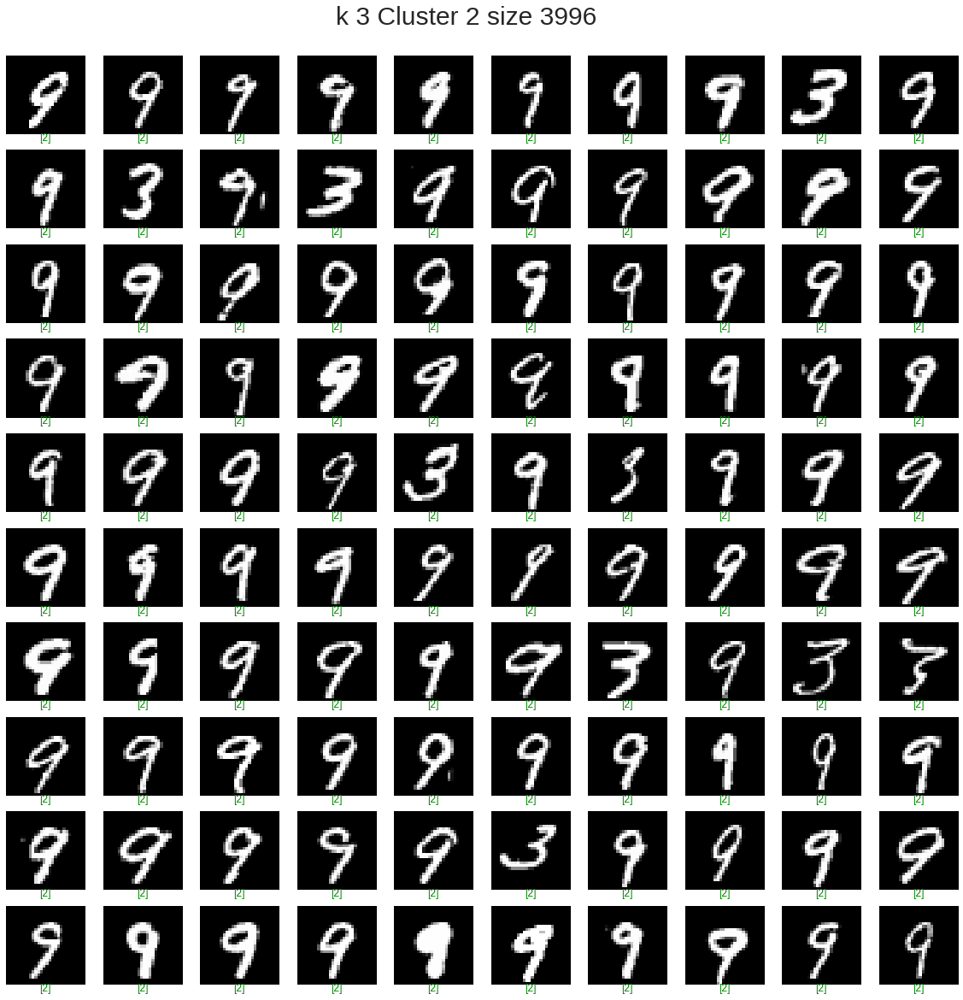

...

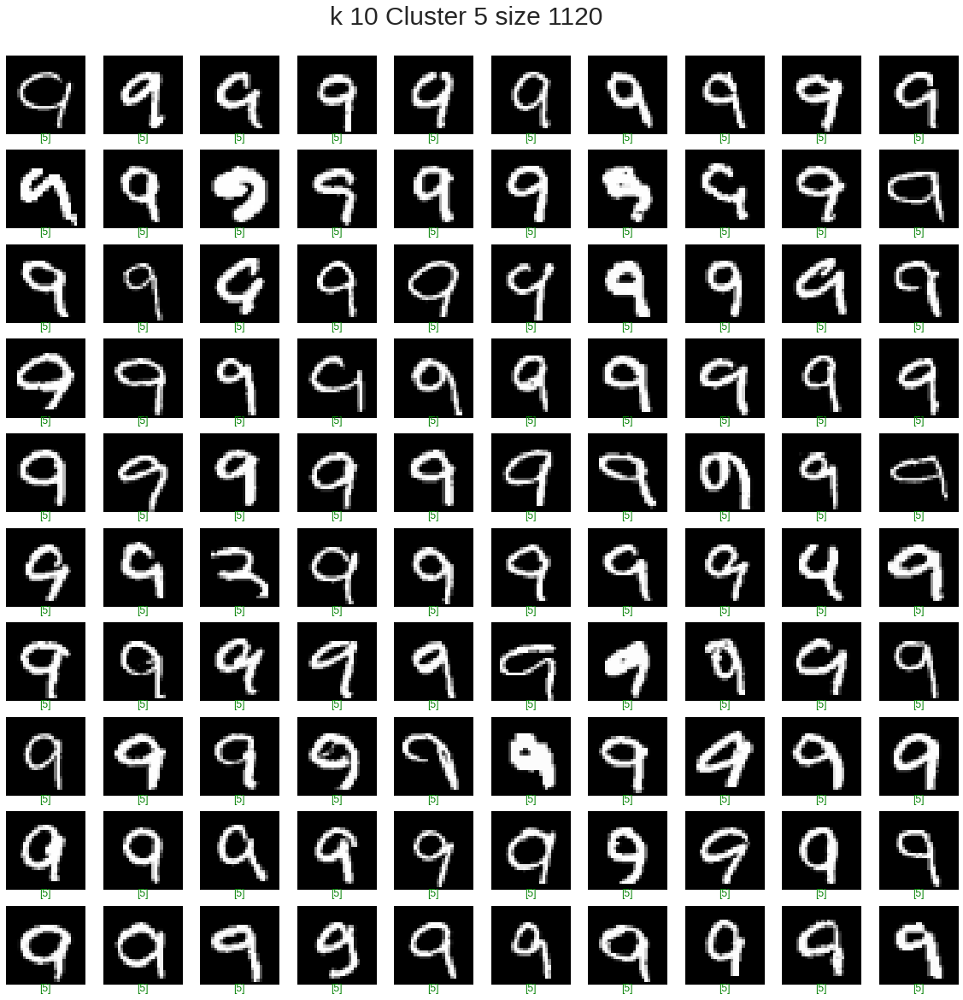

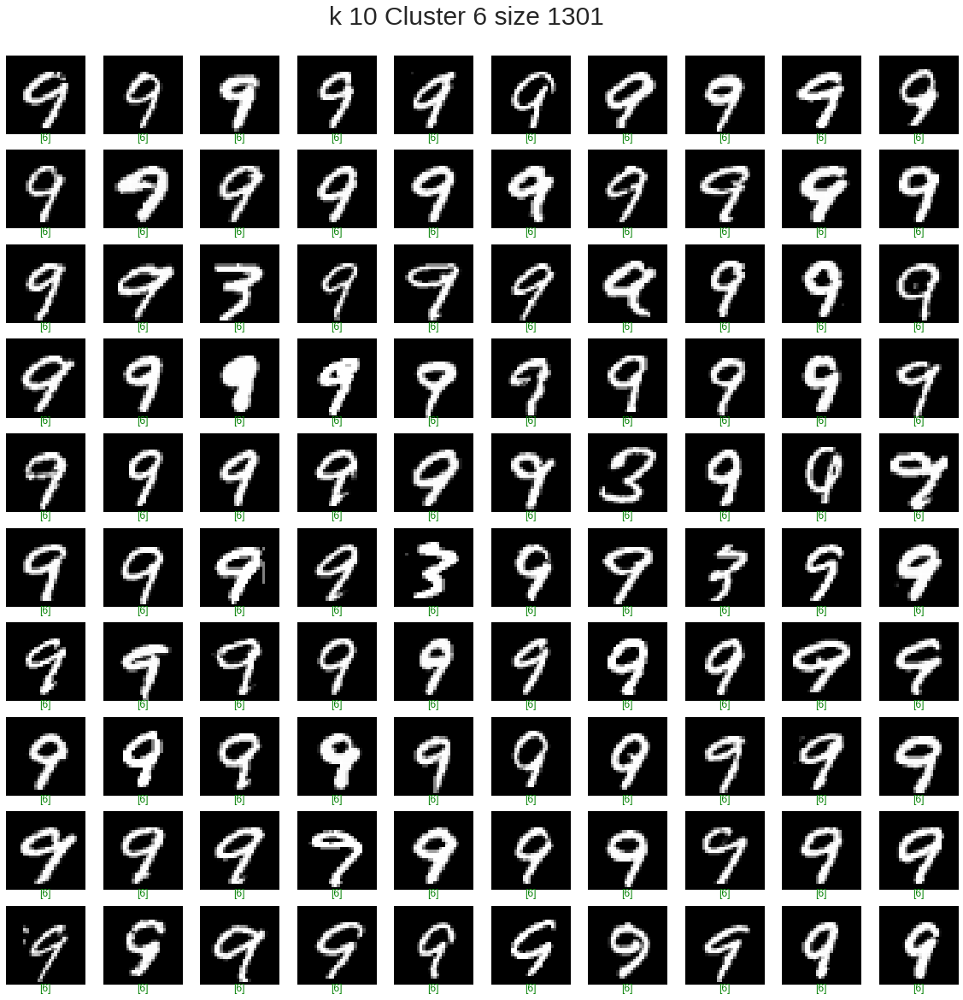

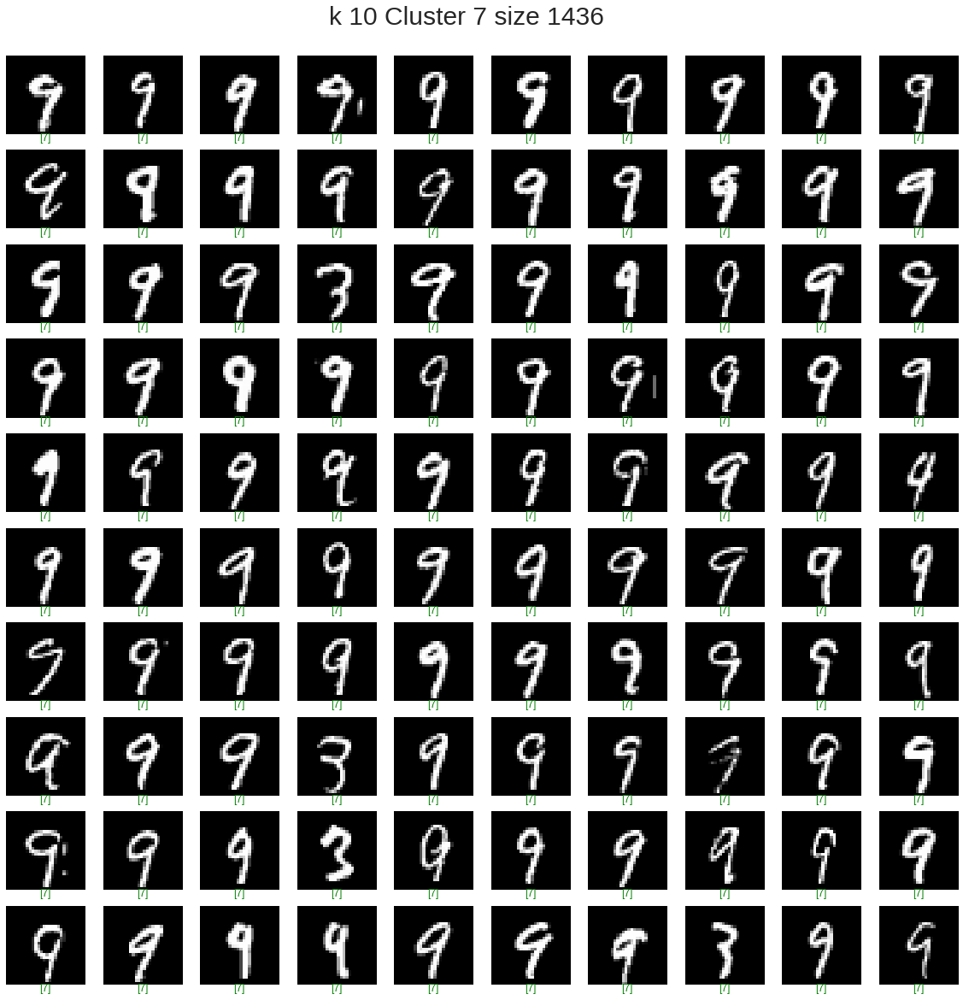

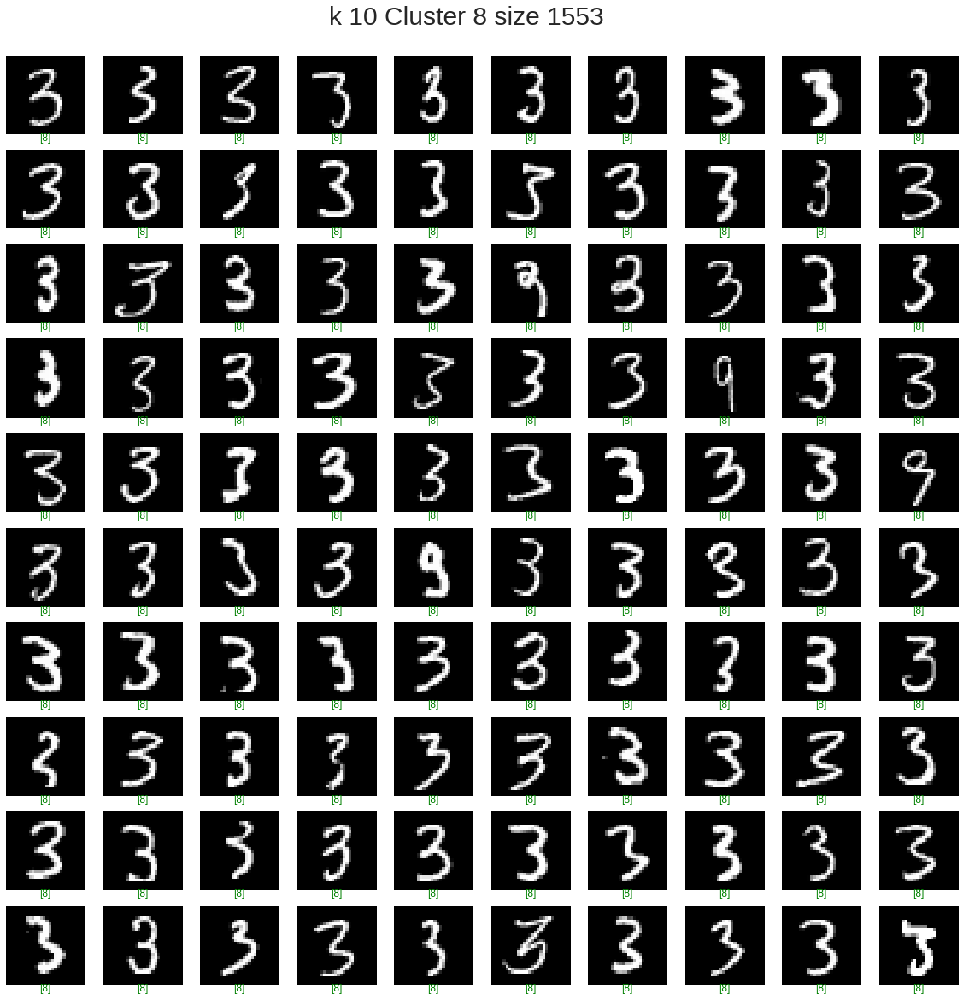

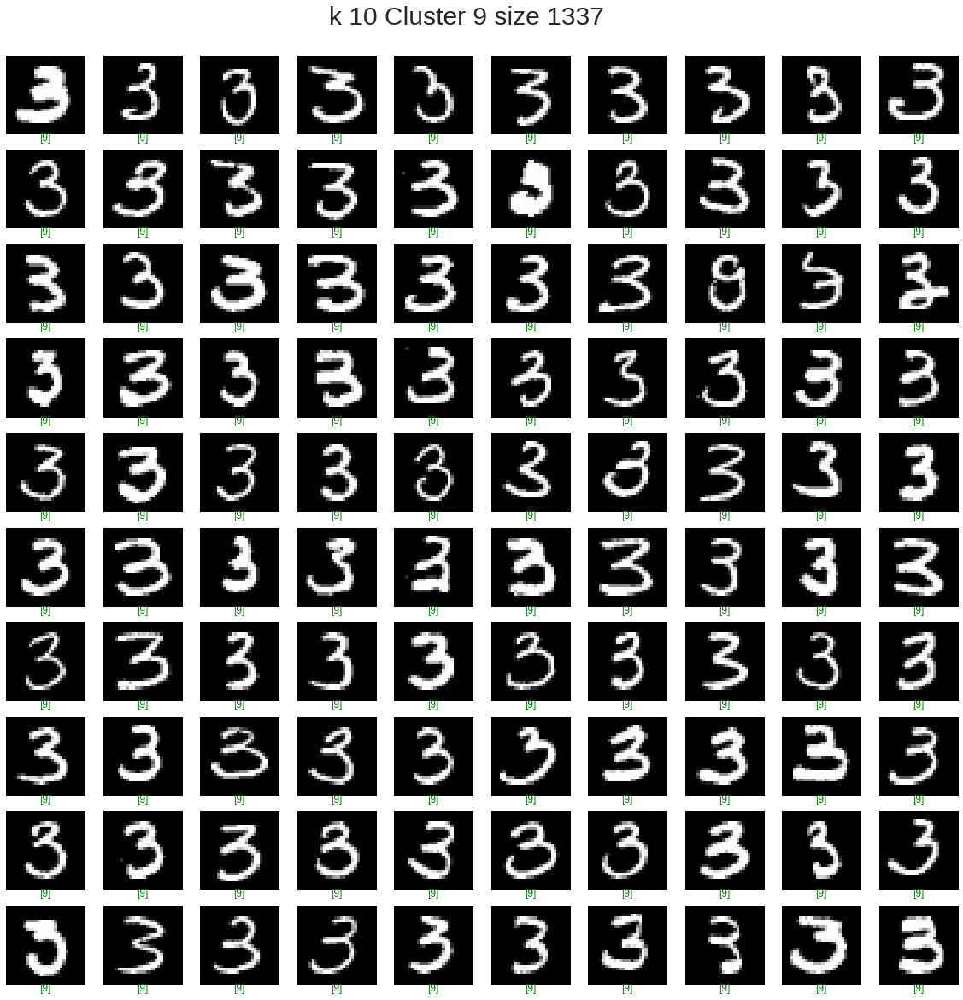

In [27]:
for k in [2, 3, 5, 10]:
    print(k)
    clusters = kMeans(data, k=k, max_iter=100)
    for cluster_id in range(k):
        visualize_image(clusters, 'raw', k, cluster_id)

2 dim eigenspaces
k 2
Iter:    0, SSE:   40272.0429, Tolerance:          inf
Iter:    1, SSE:   31905.5839, Tolerance:    8366.4590
Iter:    2, SSE:   29649.5539, Tolerance:    2256.0300
Iter:    3, SSE:   29272.1663, Tolerance:     377.3876
Iter:    4, SSE:   29233.7422, Tolerance:      38.4242
Iter:    5, SSE:   29231.7517, Tolerance:       1.9904
Iter:    6, SSE:   29233.1002, Tolerance:      -1.3485
Iter:    7, SSE:   29233.3807, Tolerance:      -0.2804
Iter:    8, SSE:   29233.5906, Tolerance:      -0.2099
Iter:    9, SSE:   29233.5906, Tolerance:       0.0000
k 3
Iter:    0, SSE:   30735.9262, Tolerance:          inf
Iter:    1, SSE:   27660.2848, Tolerance:    3075.6414
Iter:    2, SSE:   26600.9017, Tolerance:    1059.3831
Iter:    3, SSE:   25590.4215, Tolerance:    1010.4801
Iter:    4, SSE:   24644.5084, Tolerance:     945.9131
Iter:    5, SSE:   23989.4952, Tolerance:     655.0132
Iter:    6, SSE:   23527.4839, Tolerance:     462.0113
Iter:    7, SSE:   23322.4846, Toleranc

<ipython-input-9-bc5ef1e32d69>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(2*cols, 2*rows)) # defining a figure


5 dim eigenspaces
k 2
Iter:    0, SSE:   54766.5686, Tolerance:          inf
Iter:    1, SSE:   51077.5378, Tolerance:    3689.0308
Iter:    2, SSE:   48803.9491, Tolerance:    2273.5887
Iter:    3, SSE:   47764.0639, Tolerance:    1039.8852
Iter:    4, SSE:   47497.7299, Tolerance:     266.3340
Iter:    5, SSE:   47465.5208, Tolerance:      32.2091
Iter:    6, SSE:   47464.2892, Tolerance:       1.2316
Iter:    7, SSE:   47465.1303, Tolerance:      -0.8411
Iter:    8, SSE:   47465.2800, Tolerance:      -0.1498
Iter:    9, SSE:   47465.1768, Tolerance:       0.1032
Iter:   10, SSE:   47465.1550, Tolerance:       0.0219
Iter:   11, SSE:   47465.1550, Tolerance:       0.0000
k 3
Iter:    0, SSE:   48247.2294, Tolerance:          inf
Iter:    1, SSE:   46217.8122, Tolerance:    2029.4172
Iter:    2, SSE:   45676.7979, Tolerance:     541.0143
Iter:    3, SSE:   45441.2490, Tolerance:     235.5489
Iter:    4, SSE:   44993.0761, Tolerance:     448.1730
Iter:    5, SSE:   44330.7793, Toleranc

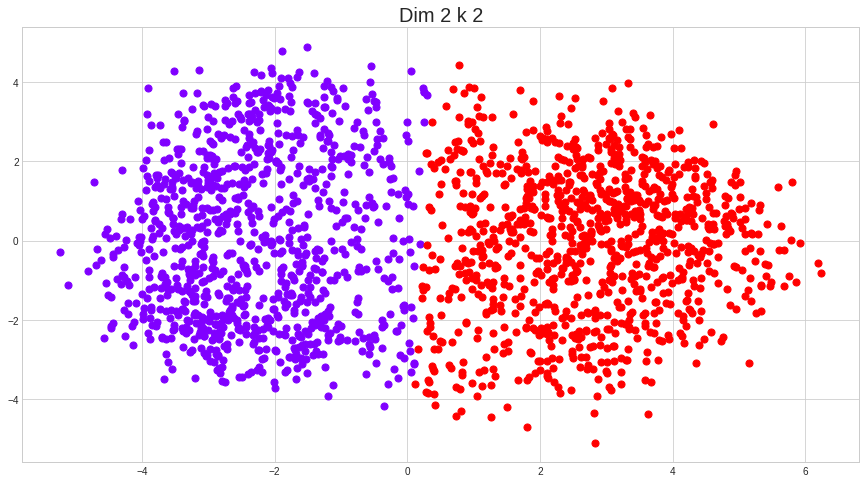

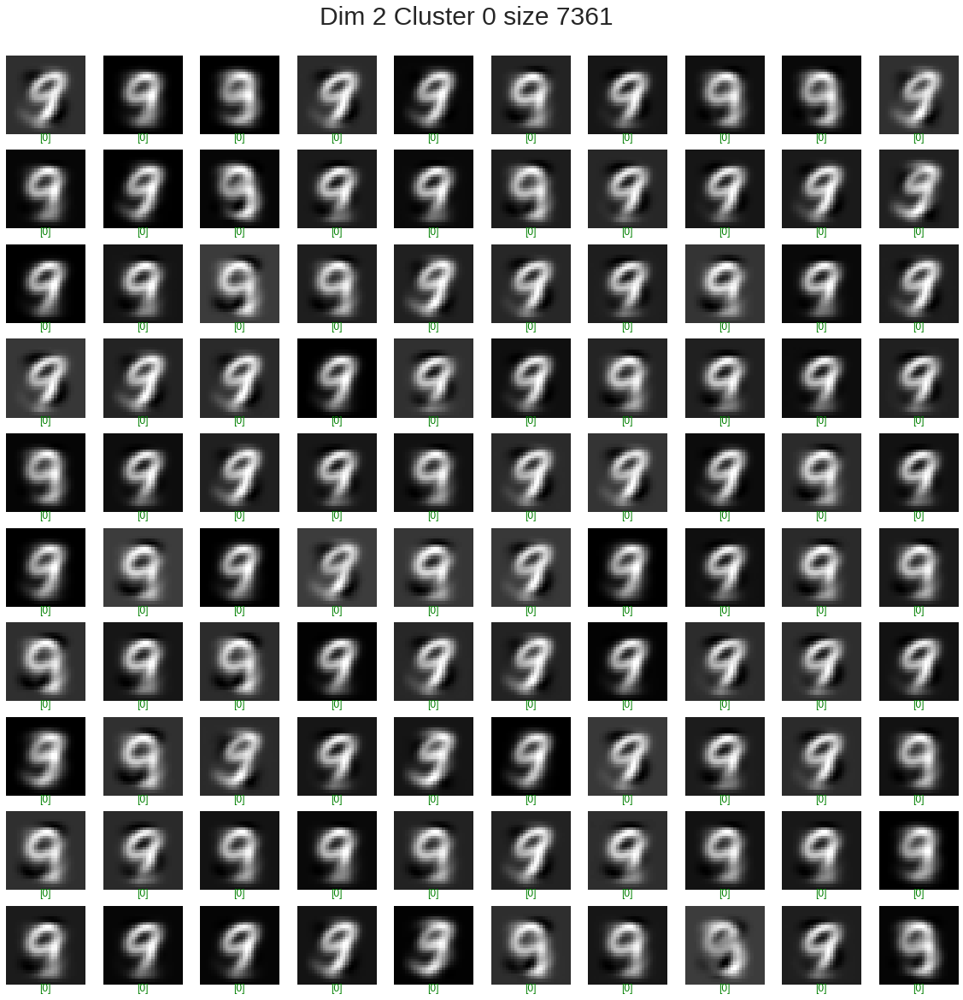

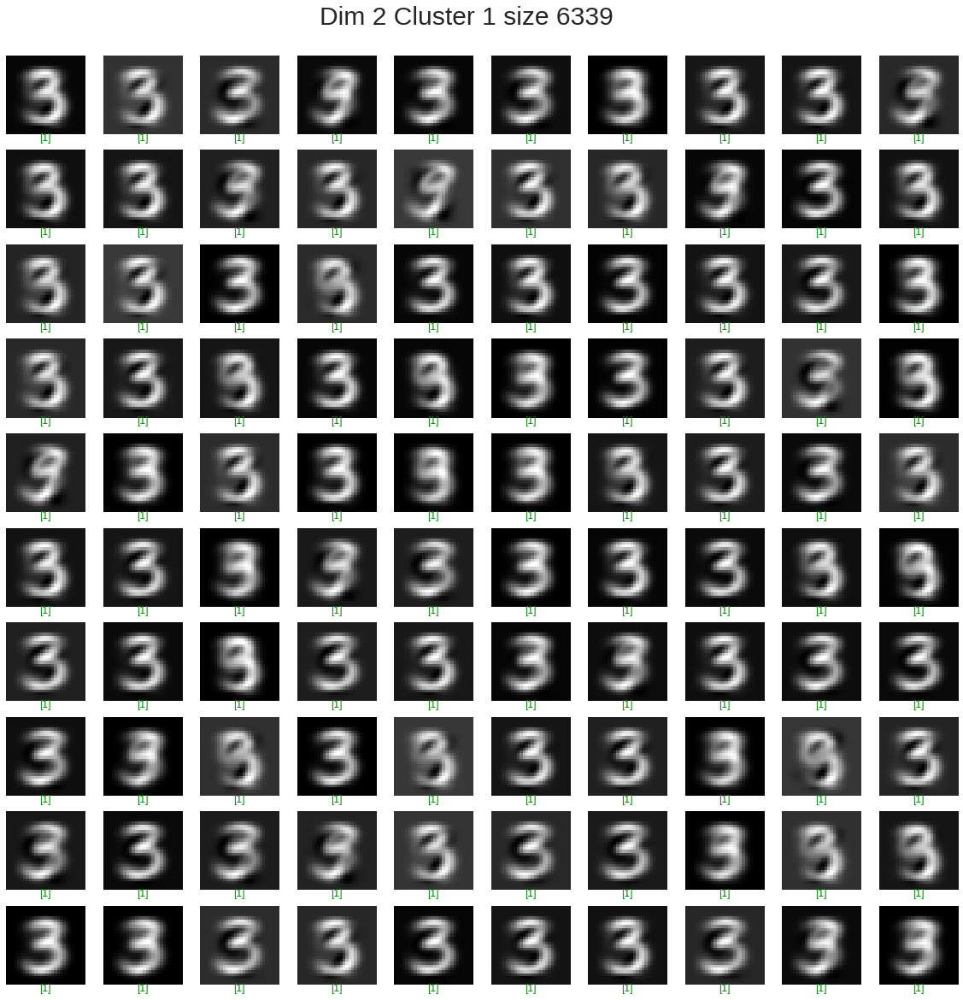

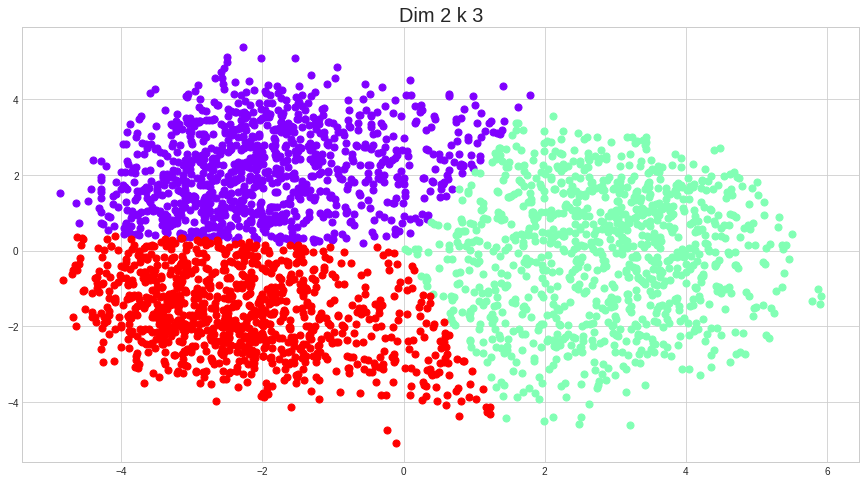

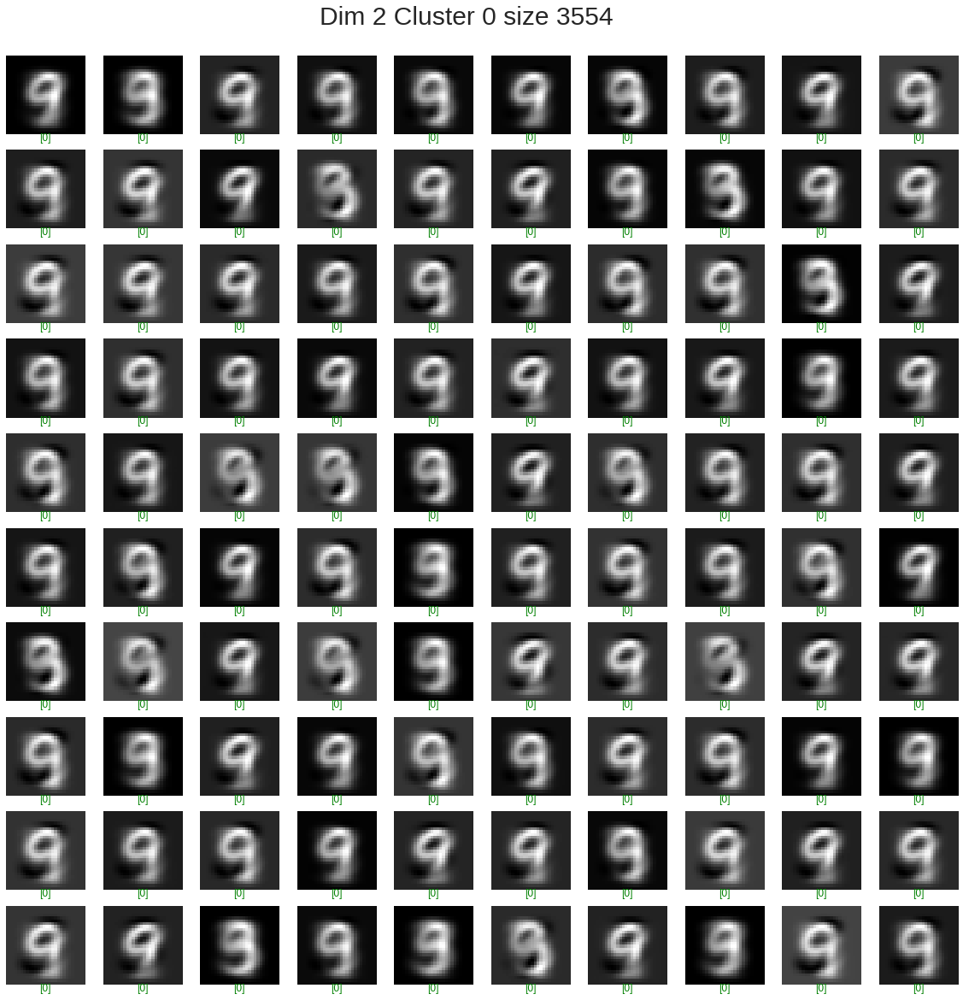

...

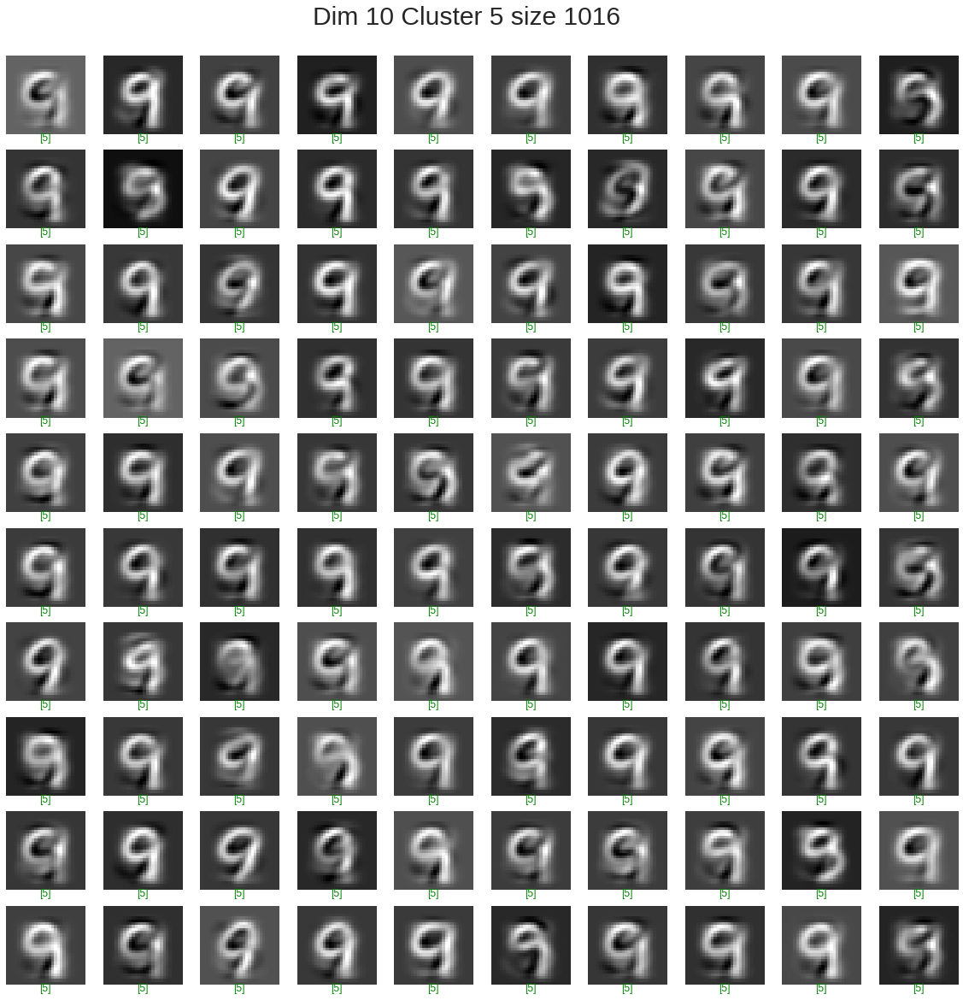

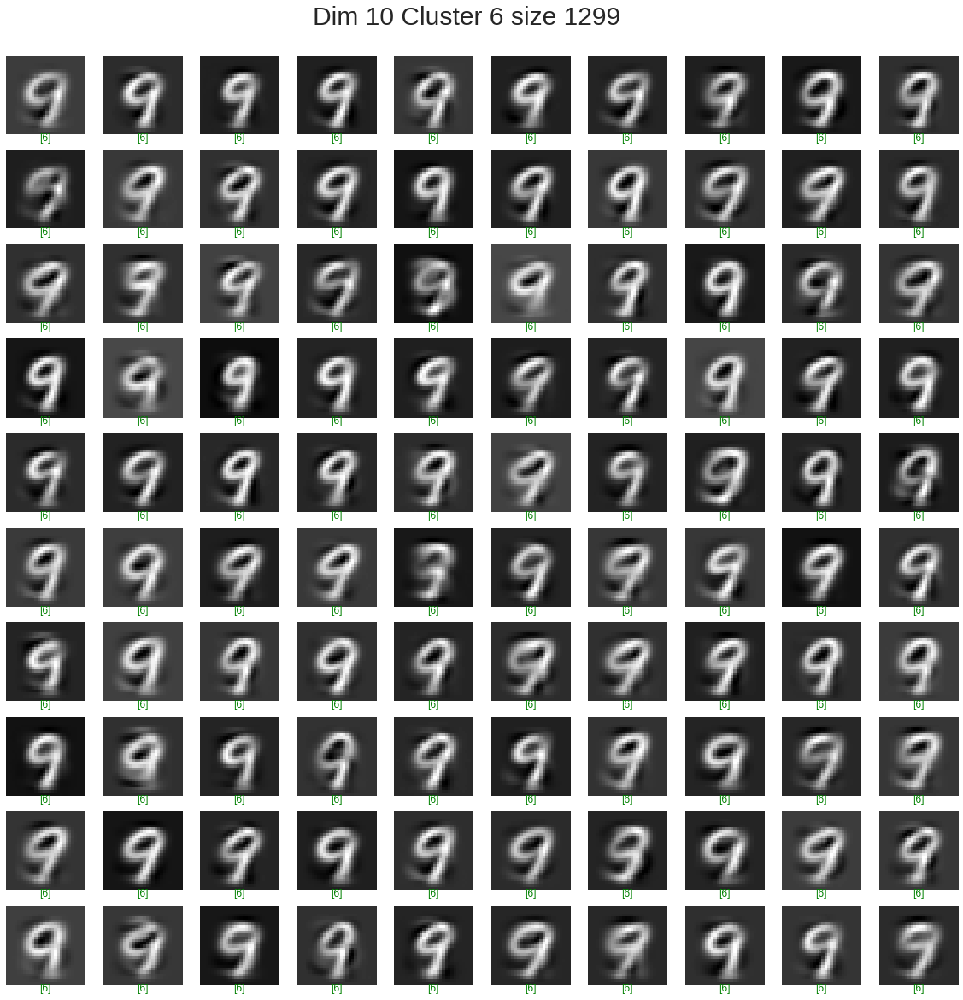

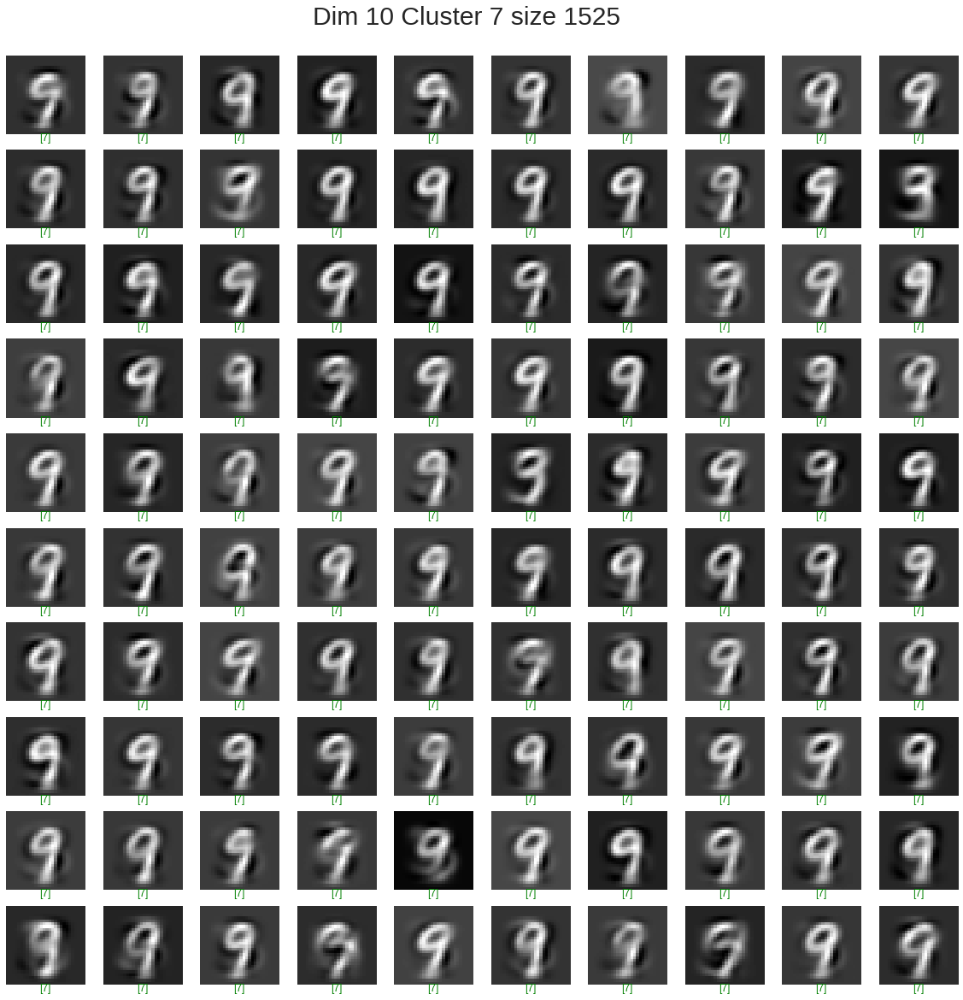

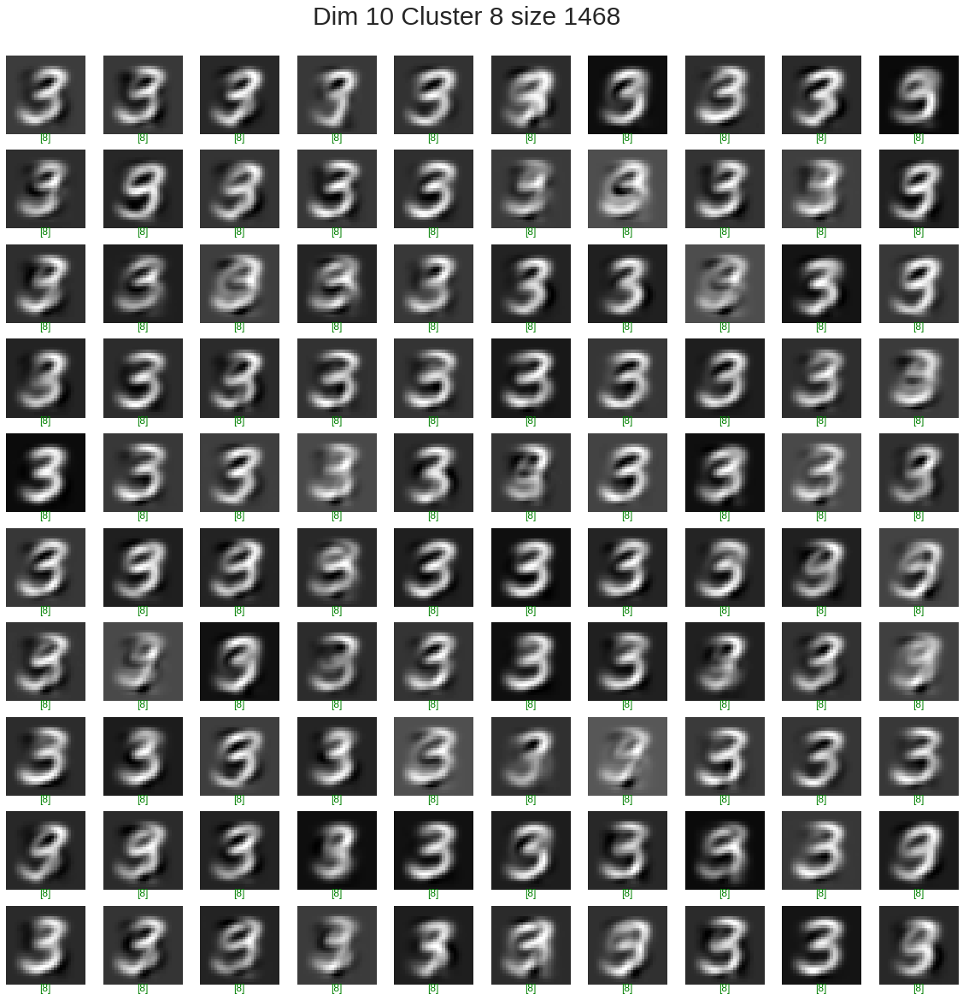

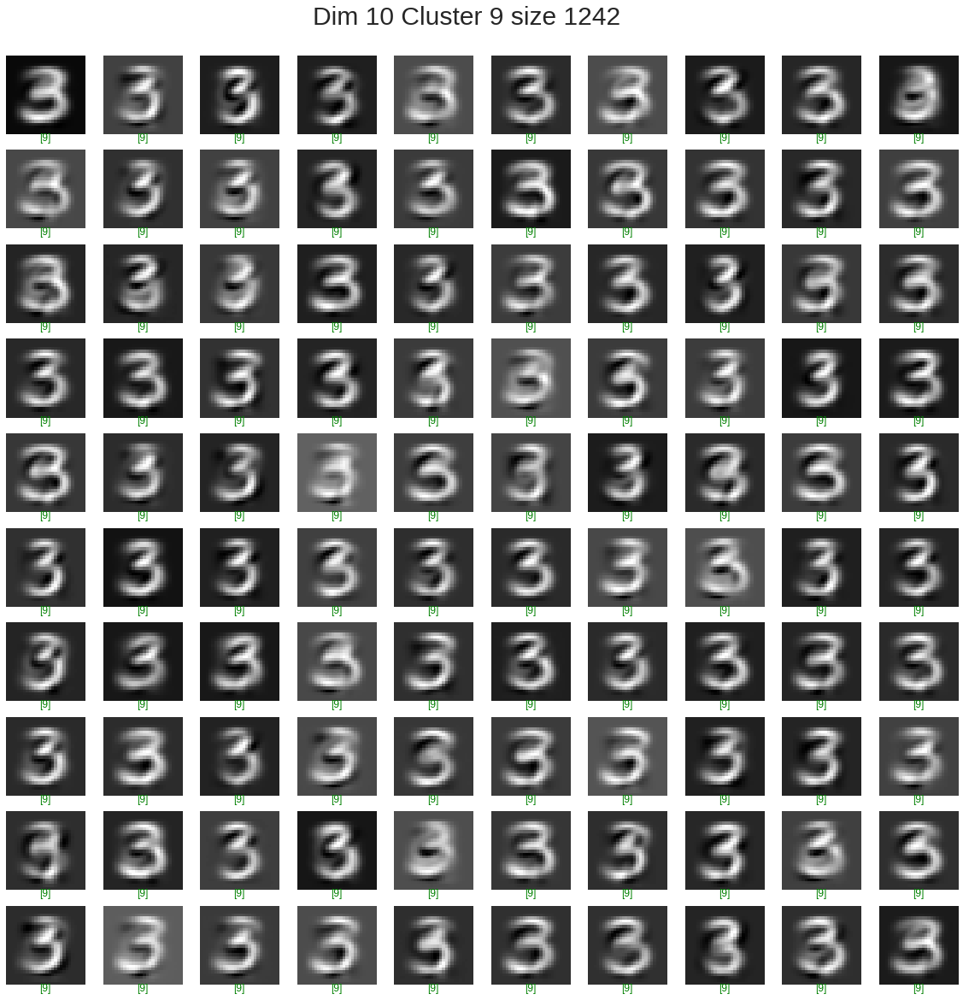

In [26]:
for d in [2, 5, 10]:
    pca = PCA(n_components=d)
    reduced_data = pca.fit_transform(data)
    print(pca.n_components_, 'dim eigenspaces')
    
    for k in [2, 3, 5, 10]:
        print('k', k)
        clusters = kMeans(reduced_data, k=k, max_iter=100)
        colors = iter(cm.rainbow(np.linspace(0, 1, k)))
        if d == 2:
            plt.figure(figsize=(15, 8))
            scatter_size = min([len(clusters[i]) for i in range(k)])
            for i in range(k):
                next_color = next(colors)
                for j in random.sample([n for n in range(scatter_size)], 1000):
                    plt.scatter(clusters[i][j][0], clusters[i][j][1], 
                                color=next_color, marker='o', s=50, linewidths=1)
                    
            plt.title('Dim {} k {}'.format(d, k), fontsize=20)
            plt.savefig('kMeans_scatter_{}_{}.jpg'.format(d, k))
        for cluster_id in range(k):
            visualize_image(clusters, d, k, cluster_id)